# Reddit links

**Author: Clara Moore**

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import networkx as nx
from graspologic.plot import heatmap
import networkx.algorithms.community as nx_comm
from graspologic.layouts.colors import _get_colors
from graspologic.embed import LaplacianSpectralEmbed
from graspologic.utils import pass_to_ranks
from umap import UMAP
from graspologic.plot import networkplot
import networkx.algorithms.community as nx_comm
from graspologic.plot import networkplot, heatmap
from graspologic.partition import leiden, modularity
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score


colors = _get_colors(True, None)["nominal"]


/Users/claramoore/Desktop/VSCode_Projecrs/TestingStuff/venv/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Notebook overview
## Credits:
### Data Source: http://snap.stanford.edu/conflict/
### Visualization code taken from course page and slightly adapted
## About notebook
### This notebook analyzes data from reddit, specifically hyperlinks in post titles linking to 
### other subreddits. I primarily use data from 2014 from the source linked above, but also
### use a much smaller dataset from 2023, which I used the reddit API and bs4 to obtain. In this dataset,
### the graphs are directed. The nodes represent subreddits, while the edges represent a post being made,
### containing the other subreddit's link in its title. The weights on the edges represent the number of
### posts being made like this between 2 subreddits.
## Sections
### 1- Reading in dataframes, cleaning data, and building the weighted + directed graphs
### 2 - Visualization
### 3 - Measuring centrality
### 4 - Measuring modularity + detecting communities
### 5 - Analyzing negative traffic
### 6 - Comparing 2023 vs. 2014 data

# 1 - Reading in dataframes, data cleaning, creating DiGraphs

In [253]:
def round_link_setiment(orig_sent):
    if orig_sent <= -.15:
        return -1
    if orig_sent >= .15:
        return 1
    else:
        return 0

In [254]:
data_2023A = pd.read_csv('stored_data9.csv')
data_2023B = pd.read_csv('stored_data12.csv')
data_2023 = pd.concat([data_2023A,data_2023B]).drop_duplicates().reset_index(drop=True)
data_2023['SOURCE_SUBREDDIT'] = data_2023['subreddit'].str.lower()
data_2023['TARGET_SUBREDDIT'] = data_2023['linked_sub'].str.lower()
data_2023['LINK_SENTIMENT'] = data_2023.apply(lambda row: round_link_setiment(row.sentiment),axis=1)

In [255]:
data_2014 = pd.read_csv('soc-redditHyperlinks-title.tsv',sep='\t')

In [256]:
data_2014['SO-TA'] = data_2014.apply(lambda row: make_pair(row['SOURCE_SUBREDDIT'],row['TARGET_SUBREDDIT']),axis=1)

In [257]:
data_2023['SO-TA'] = data_2023.apply(lambda row: make_pair(row['SOURCE_SUBREDDIT'],row['TARGET_SUBREDDIT']),axis=1)

In [258]:
def make_pair(str1, str2):
    return (str1, str2)

In [259]:
def make_di_graph(df):
    val_counts = dict(df['SO-TA'].value_counts())
    G = nx.DiGraph()
    for key, val in val_counts.items():
        G.add_edge(key[0], key[1], weight=val)
        
    return G

In [260]:
G_2014 = make_di_graph(data_2014)

In [261]:
G_neg_2014 = make_di_graph(data_2014[data_2014['LINK_SENTIMENT']==-1])

In [262]:
G_2023 = make_di_graph(data_2023)

In [263]:
G_neg_2023 = make_di_graph(data_2023[data_2023['LINK_SENTIMENT']==-1])

# 2 - Visualization

## Finding louvian communities

In [264]:
def get_communities(G):
    comms = nx_comm.louvain_communities(G)
    comms.sort(key=len,reverse=True)
    
    comm_dict = {}
    index = 0
    
    for comm in comms:
        for item in comm:
            comm_dict[item] = index
        if index == 10:
            break
        index += 1
        
    return comm_dict

In [265]:
# code taken from course page
def subsample_edges(adjacency, n_edges_kept=100_000):
    row_inds, col_inds = np.nonzero(adjacency)
    n_edges = len(row_inds)
    if n_edges_kept > n_edges:
        return adjacency

    choice_edge_inds = np.random.choice(n_edges, size=n_edges_kept, replace=False)
    row_inds = row_inds[choice_edge_inds]
    col_inds = col_inds[choice_edge_inds]
    data = adjacency[row_inds, col_inds]

    return csr_array((data, (row_inds, col_inds)), shape=adjacency.shape)

In [266]:
# code (mostly) taken from course page
def draw_graph(G, label_min):
    comm_dict = get_communities(G)
    palette = dict(zip(range(0, 11), colors))
    node_df = pd.DataFrame.from_dict(comm_dict,orient='index',columns=['community'])
    nodelist = node_df.index
    adj = nx.to_scipy_sparse_array(G, nodelist=nodelist)
    node_df["strength"] = adj.sum(axis=1) + adj.sum(axis=0)
    node_df['rank_strength'] = node_df['strength'].rank(method='dense')
    
    ptr_adj = pass_to_ranks(adj)
    lse = LaplacianSpectralEmbed(n_components=32, concat=True)
    lse_embedding = lse.fit_transform(ptr_adj)
    
    n_components = 32
    n_neighbors = 32
    min_dist = 1
    metric = "cosine"
    umap = UMAP(
        n_components=2,
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        metric=metric,
    )
    umap_embedding = umap.fit_transform(lse_embedding)
    node_df["x"] = umap_embedding[:, 0]
    node_df["y"] = umap_embedding[:, 1]
    
    big_nodes = G.degree()
    label_nodes = set()
    for key, val in dict(big_nodes).items():
        if val > label_min:
            label_nodes.add(key)
            
    node_df['label'] = node_df.index.isin(label_nodes)
    labels_df = node_df[node_df['label']]
    already_labeled = set()
    
    sub_adj = subsample_edges(adj, 100_000)

    ax = networkplot(
        sub_adj,
        x="x",
        y="y",
        node_data=node_df,
        node_size="rank_strength",
        node_sizes=(10, 150),
        figsize=(20, 20),
        node_hue="community",
        edge_linewidth=0.3,
        palette=palette,
    )
    ax.axis("off")

    for row in labels_df.iterrows():
        x_coord = row[1]['x'] + 0.2
        y_coord = row[1]['y']
        color_num = row[1]['community']
        comm_name = row[0]
        for labeled in already_labeled:
            while (2*(labeled[0]-x_coord)*(labeled[0]-x_coord) + (labeled[1]-y_coord)*(labeled[1]-y_coord) < 4):
                y_coord -= 0.2
                x_coord += 0.5
            
        already_labeled.add((x_coord,y_coord))
 
        ax.text(x_coord,y_coord,comm_name,fontsize=8,color=palette[color_num],backgroundcolor='white')


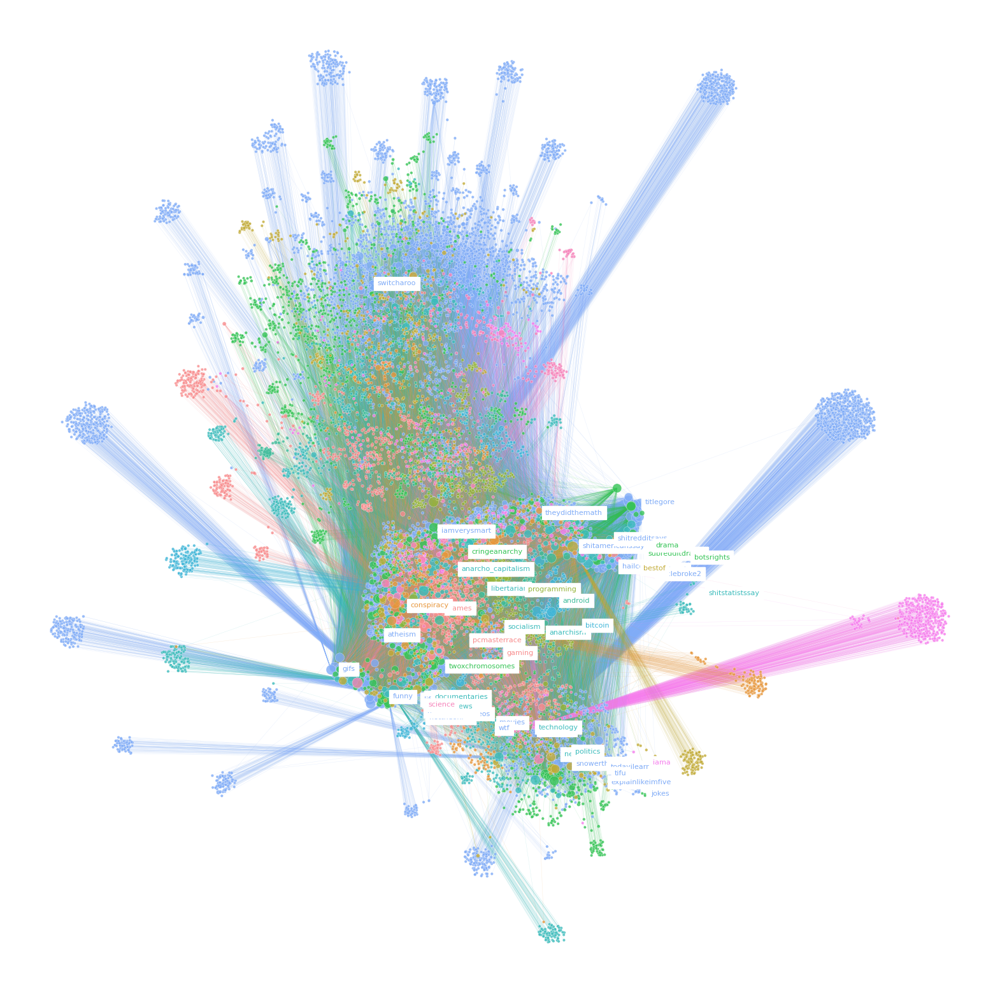

In [269]:
draw_graph(G_2014, 500)

/Users/claramoore/Desktop/VSCode_Projecrs/TestingStuff/venv/lib/python3.10/site-packages/graspologic/embed/base.py:199: UserWarning: Input graph is not fully connected. Results may notbe optimal. You can compute the largest connected component byusing ``graspologic.utils.largest_connected_component``.
  warnings.warn(msg, UserWarning)


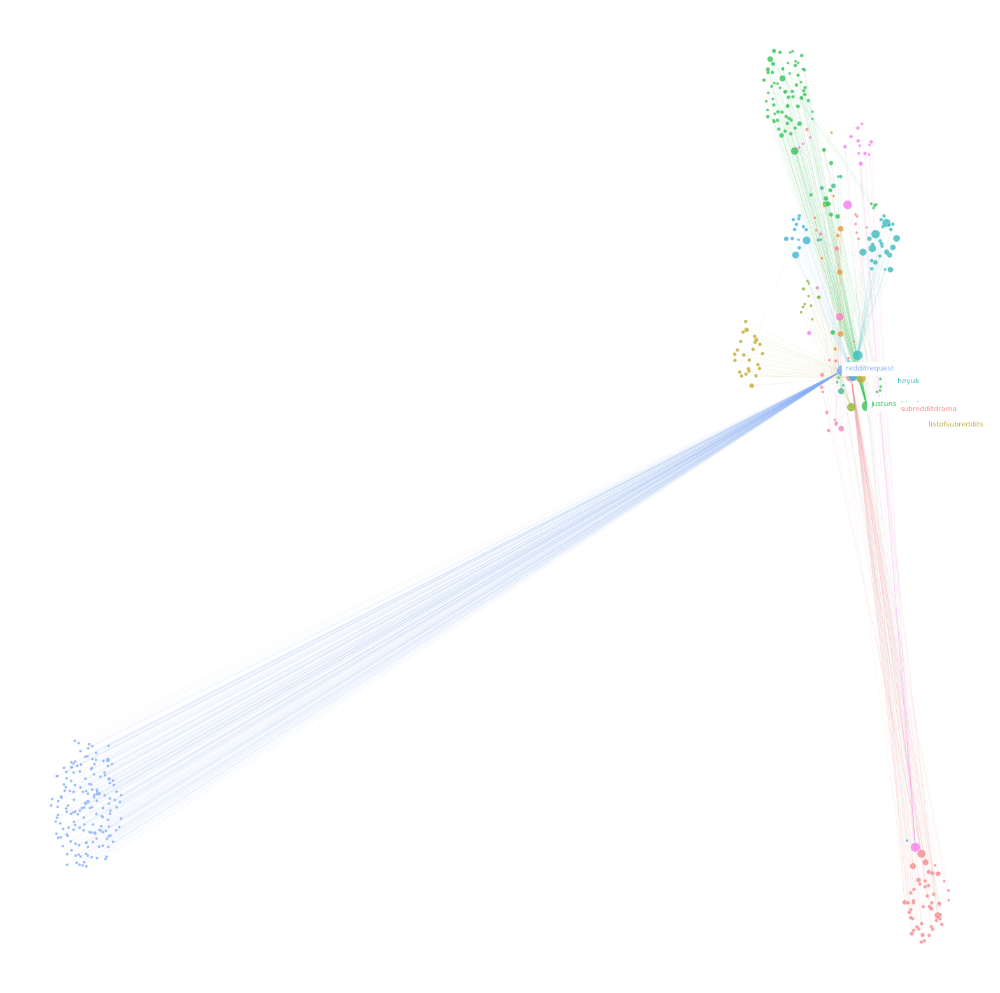

In [270]:
draw_graph(G_2023, 20)

# 3 - Centrality Measures 

In [271]:
nx.is_weakly_connected(G_2014)

False

In [272]:
# take largest connected component so eigenvector centrality works
largest_cc = max(nx.weakly_connected_components(G_2014), key=len)
largest_cc = G_2014.subgraph(largest_cc)

In [273]:
centrality = nx.eigenvector_centrality(largest_cc, max_iter=300)

In [275]:
sorted_centrality = {k: v for k, v in sorted(centrality.items(), key=lambda item: item[1], reverse=True)}

In [277]:
pageranked = nx.pagerank(largest_cc)

In [278]:
sorted_pageranked = {k: v for k, v in sorted(pageranked.items(), key=lambda item: item[1], reverse=True)}

In [280]:
degree_centrality = dict(nx.degree(G_2014))

In [281]:
sorted_degree_centrality = {k: v for k, v in sorted(degree_centrality.items(), key=lambda item: item[1], reverse=True)}

In [284]:
centralities = pd.DataFrame([sorted_centrality, sorted_pageranked, sorted_degree_centrality]).T

In [292]:
centralities.columns = ['eigenvector_centrality', 'pagerank','degree_centrality']

In [315]:
centralities['sub'] = centralities.index

In [322]:
def get_out_degree(sub):
    return G_2014.out_degree(sub)

In [325]:
def get_in_degree(sub):
    return G_2014.in_degree(sub)

In [331]:
centralities['out_degree'] = centralities.apply(lambda row: get_out_degree(row['sub']), axis=1)

In [332]:
centralities['in_degree'] = centralities.apply(lambda row: get_in_degree(row['sub']), axis=1)

In [334]:
centralities = centralities.drop('sub',axis=1)

In [336]:
centralities.head(20)

,eigenvector_centrality,pagerank,degree_centrality,out_degree,in_degree
iama,0.245731,0.019820,3706.0,6,3700
askreddit,0.237335,0.018580,4164.0,0,4164
pics,0.201227,0.010221,2909.0,165,2744
funny,0.196630,0.009736,2990.0,455,2535
videos,0.192949,0.007856,2329.0,239,2090
todayilearned,0.176295,0.005445,2487.0,389,2098
worldnews,0.140717,0.005357,1541.0,150,1391
gaming,0.138902,0.006065,2070.0,684,1386
news,0.137688,0.003922,1500.0,249,1251
gifs,0.126054,0.004288,1334.0,36,1298


## Generally, the centrality ranks are highly correlated with each other. In-degree centrality appears to be more relevant than out-degree centrality, which makes sense.

#  4 - Modularity + Communities

In [337]:
def determine_modularity(di_graph):
    undir_graph = di_graph.to_undirected()
    leiden_partition_map = leiden(undir_graph, trials=100)
    return modularity(undir_graph, leiden_partition_map)

In [338]:
determine_modularity(G_2014)

0.4637194591212084

In [459]:
determine_modularity(G_neg_2014)

0.399419090523531

In [462]:
# really high modularity in the 2023 dataset, likely because of the way I sourced the data

In [460]:
determine_modularity(G_2023)

0.9591962571203899

In [461]:
determine_modularity(G_neg_2023)

0.8847887389053273

In [346]:
comms = nx_comm.louvain_communities(largest_cc)
comms.sort(key=len,reverse=True)

In [464]:
def draw_community_graph(G, community):
    subgraph = G.subgraph(community)
    d = dict(nx.degree(subgraph))
    dict_keys = d.keys()
    dict_vals = d.values()
        
    labeldict = {}

    for G_node in subgraph.nodes:
        if subgraph.degree(G_node) < 60:
            labeldict[G_node] = ''
        else:
            labeldict[G_node] = G_node
                        
    edges,weights = zip(*nx.get_edge_attributes(subgraph,'weight').items())
    pos = nx.spring_layout(subgraph)
    nx.draw(subgraph, pos=pos,node_size=[v for v in dict_vals],edgelist=edges, edge_color=weights,labels=labeldict,with_labels = True,font_size=8)
    plt.show()

## Identified communities

In [407]:
# GAMING
comms[3] 

{'crowfall',
 'caught',
 'giantbomb',
 'rockleesmile',
 'promptography',
 'thespoonyexperiment',
 'gamelounge',
 'rlsd',
 'thefourkingscasino',
 'killstrain',
 'realps4',
 'gunsupgame',
 'dayofinfamy',
 'persona_gaming',
 'bigcatgifs',
 'thenotoriousdivision',
 'snk',
 'madslads',
 'divremtest',
 'gameofwar_fireage',
 'gamersinaction',
 'darksouls3',
 'discododgeball',
 'theevilwithin',
 'discjam',
 'project_scorpio',
 'playstationplus',
 'theoldballcoach',
 'modpiracy',
 'thewitness',
 'dontrevivemebro',
 'mullit',
 'achievement_hunter',
 'descent',
 'playstationvr',
 'redditbingo',
 'testsub94',
 'sandwichmasterrace',
 'diamondpigman',
 'veronicabelmont',
 'mordhau',
 'littlebigplanet',
 'shouldibuythisgame',
 'simpians',
 'injustice',
 'extralife',
 'facesoffallout',
 'steam_link',
 'divisionremnants',
 'techsupportmacgyver',
 'maximumgraphics',
 'finalfantasytactics',
 'pcmasturbatingrace',
 'pcmawwsterrace',
 'unexpectedauschwitz',
 'nvidiahelp',
 'psp',
 'flipacoinbot',
 'xboxliv

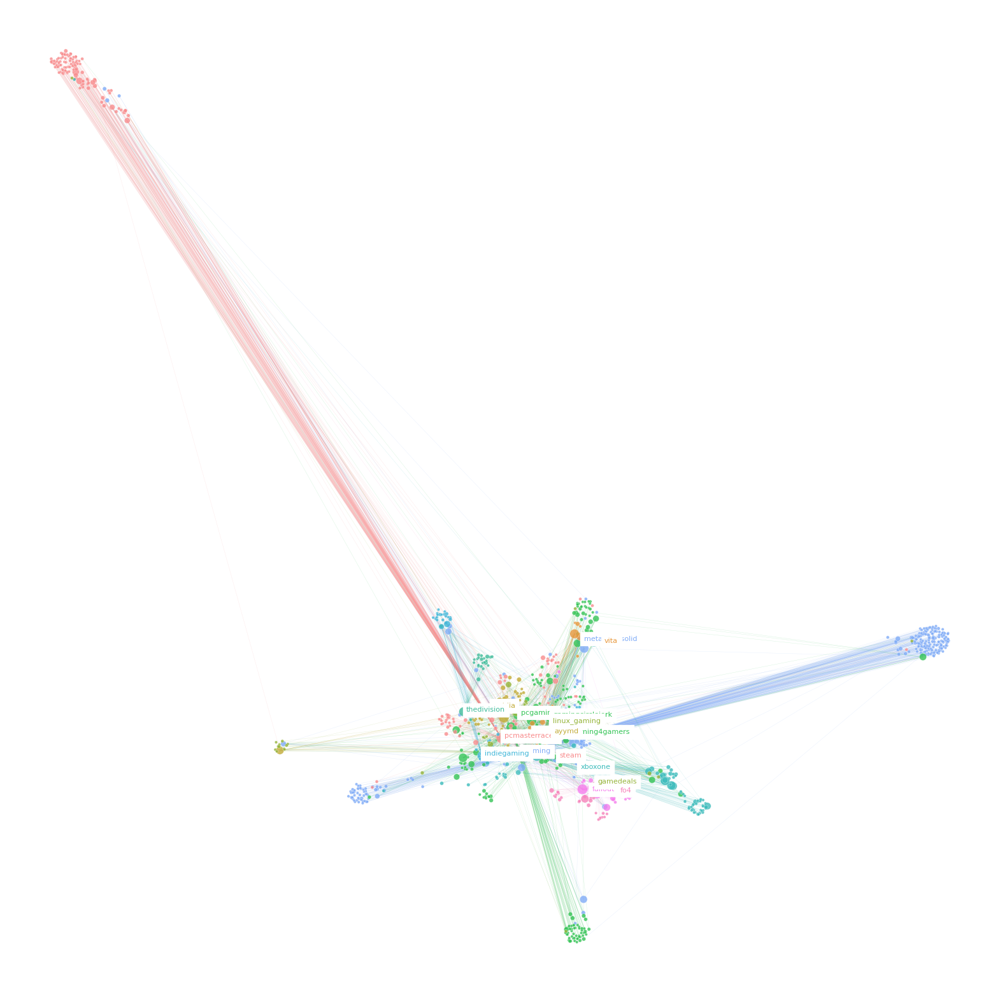

In [423]:
draw_graph(G_2014.subgraph(comms[3]), 30)

In [357]:
# CONSPIRACY THEORIES
comms[6]

{'1984isreality',
 '844thworldproblems',
 '9000sins',
 '911truth',
 '911truthers',
 '911truthwiki',
 'actualconspiracies',
 'advancedtechresearch',
 'againstthechimpire',
 'againstwhiterights',
 'agentsofdoubt',
 'agroindustrialcomplex',
 'alexjones',
 'alien_theory',
 'aliens',
 'alternativehealth',
 'alternativehistory',
 'alternativemedicines',
 'altnewz',
 'american_history',
 'americanjewishpower',
 'americanstasi',
 'anarchy',
 'ancientegypt',
 'ancientgiants',
 'ancientknowledge',
 'announcements',
 'antarcticanomalies',
 'anti_conspiracy',
 'anti_jidf',
 'anticonspiracy',
 'antifacebook',
 'antimonsanto',
 'antisemitismwatch',
 'antisjweuropean',
 'antistyle',
 'antivax',
 'anythinggoesnews',
 'arcticgate',
 'ask_privacy',
 'askscientists',
 'asterix',
 'astralprojection',
 'astronots',
 'atoptics',
 'aug2016event',
 'australianfreespeech',
 'autonewspaper',
 'awanbrothers',
 'backup',
 'badbios',
 'badgovnofreedom',
 'badmodnoupvote',
 'badmusictheory',
 'badnewsusa',
 'badsci

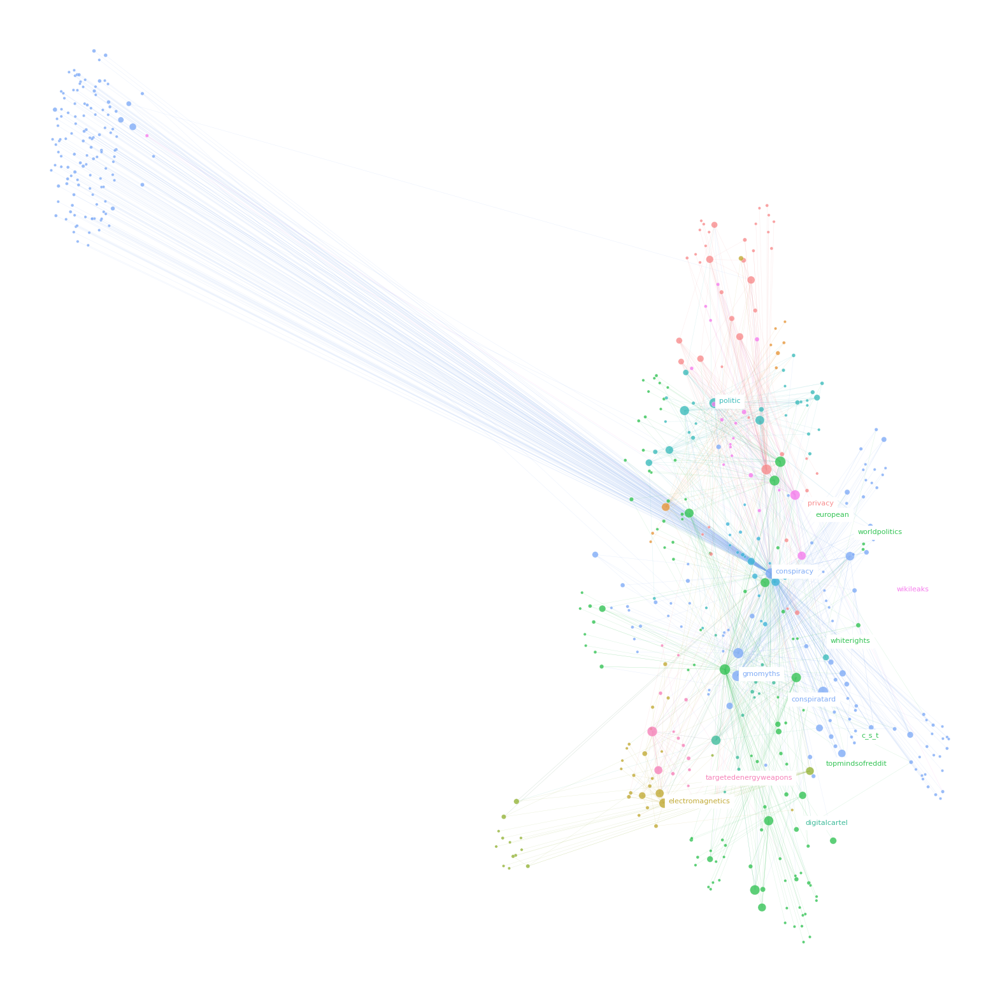

In [424]:
draw_graph(G_2014.subgraph(comms[6]), 30)

In [359]:
# DOTA + League of Legends
comms[7]

{'1308',
 'aapsquad',
 'aatroxmains',
 'ad2l',
 'adamlukas',
 'afez',
 'afrowearmy',
 'ahrilol',
 'ahrimains',
 'ahritime',
 'akalimains',
 'albusnoxluna',
 'alfred',
 'alhenalol',
 'alphadraft',
 'amateurdota2league',
 'amster2',
 'amumumains',
 'analysemydota2',
 'analyzelast100games',
 'aniviamains',
 'aplatypuss',
 'aquadragon',
 'aram',
 'arteezy',
 'atlasreactor',
 'aufbafexperiments',
 'aui_2k_circlejerk',
 'aurelion_sol_mains',
 'autodraft',
 'azirbugs',
 'azirmains',
 'azurecatalyst',
 'bardmains',
 'beaverknight',
 'bestofboth',
 'bestofbronze',
 'beyondthesummit',
 'bigfatlpjiji',
 'blem',
 'blitzmains',
 'blizzardpls',
 'boinked',
 'brofresco',
 'bronze5advice',
 'busey',
 'caitlynmains',
 'camillemains',
 'capslocked',
 'captainsmode',
 'cassiopeiamains',
 'championmains',
 'chromarequest',
 'chu8',
 'circloljerk',
 'clearlovestrophycase',
 'clg',
 'cloud9',
 'coastlife',
 'comparativemythology',
 'compdota2',
 'competitivehots',
 'coolstories',
 'crazyshithappening',
 'cs

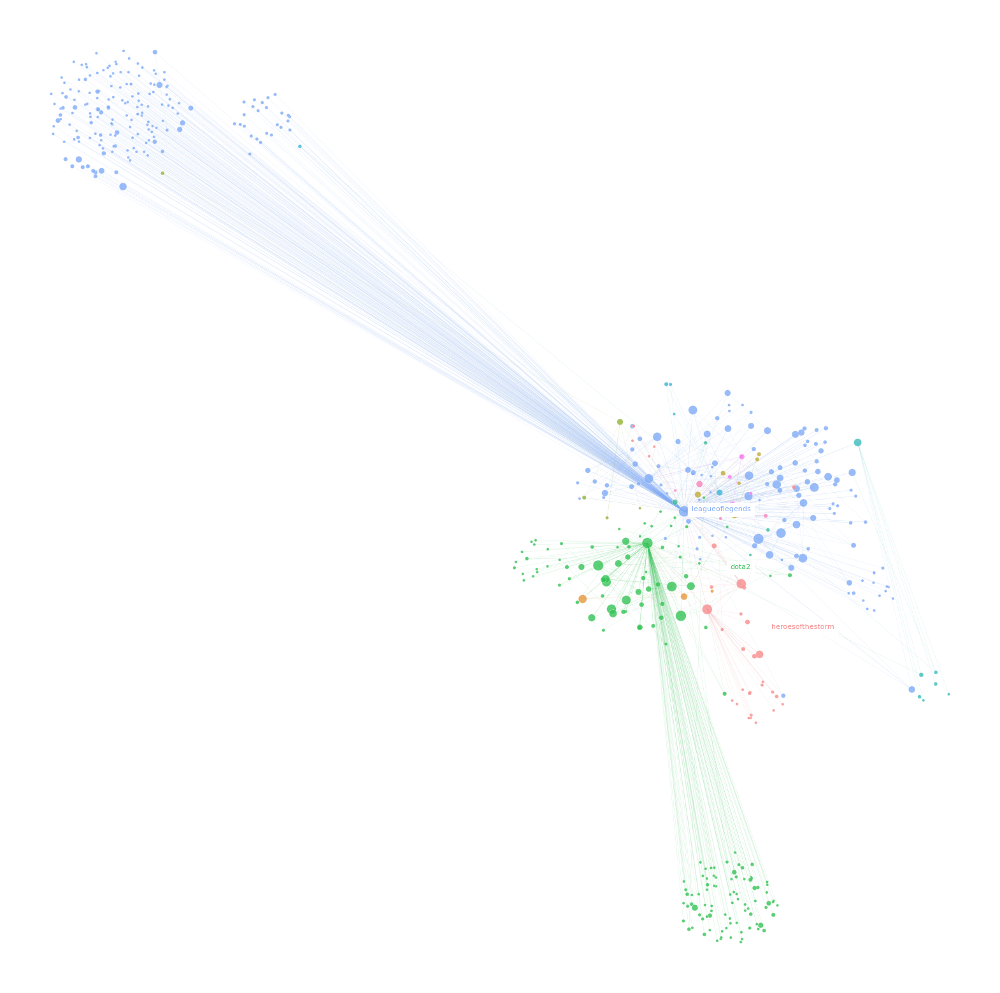

In [428]:
draw_graph(G_2014.subgraph(comms[7]), 20)

In [361]:
# SCIENCE + HEALTHCARE
comms[8]

{'23andme',
 'aboutdopamine',
 'academia',
 'acl',
 'activism',
 'adayinthelife',
 'agingbiology',
 'aiphilosophy',
 'alienagenda',
 'allthesciences',
 'als',
 'altcancer',
 'altdiabetes',
 'alternativecancer',
 'altmicrobiology',
 'ancientmigrations',
 'anecdote',
 'anesthesiology',
 'animalbehavior',
 'animalsbeingdicks',
 'animalwelfarescience',
 'anthropology',
 'antiagingaddiction',
 'antidepressants',
 'antipoaching',
 'antipsychiatry',
 'antipsychlibrary',
 'ants',
 'anythinggoesnorules',
 'apnurses',
 'archeology',
 'artpsychology',
 'asamother',
 'askdocs',
 'askfitness',
 'askhealth',
 'askphysics',
 'askpsychology',
 'askscience',
 'askscienceama',
 'assemblymakers',
 'asthma',
 'ateismo_br',
 'attackresist',
 'audiology',
 'ausenviro',
 'autisticconversation',
 'autoimmunity',
 'awtheory',
 'babblenerds',
 'baby_names',
 'badpsychology',
 'bane',
 'bangkokbros',
 'barleylegal',
 'batesmethod',
 'batfacts',
 'batty',
 'beakers',
 'beautiful_women',
 'beautifuldata',
 'bees',

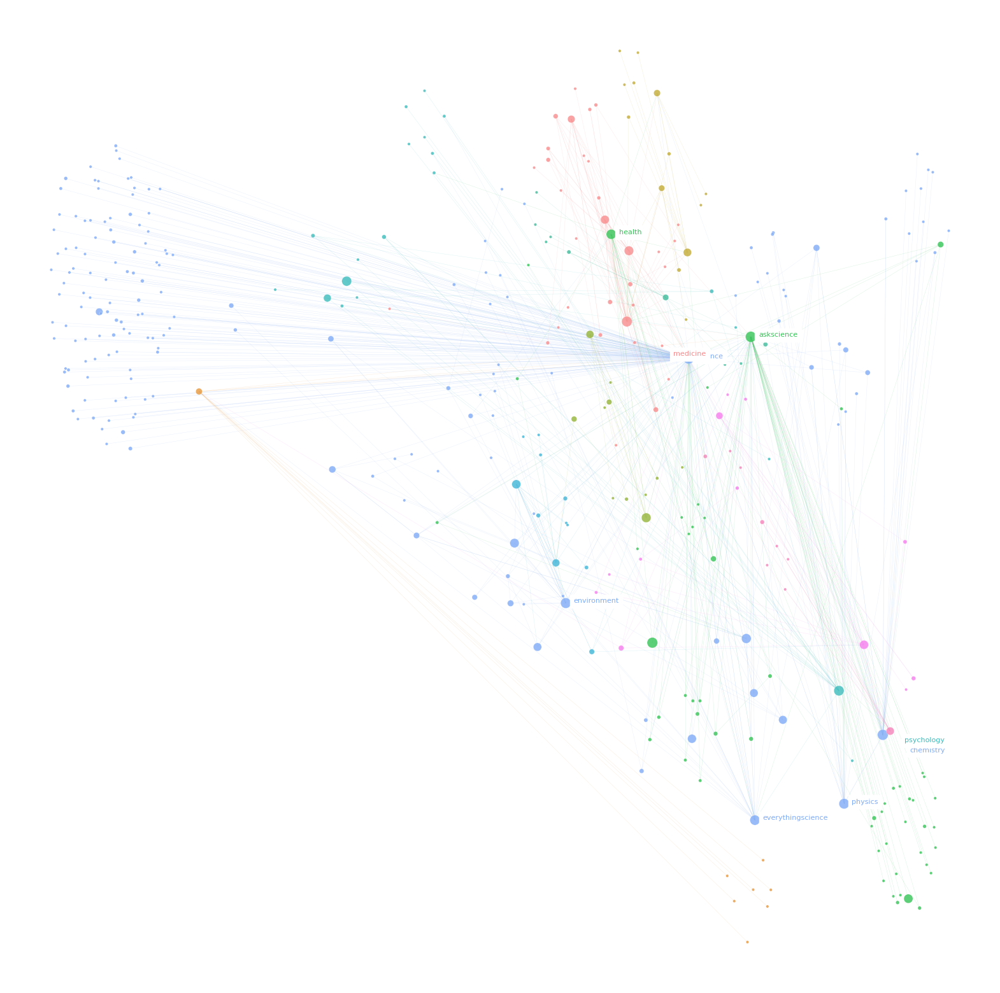

In [429]:
draw_graph(G_2014.subgraph(comms[8]), 20)

In [363]:
# INTERNATIONAL NEWS + POLITICS
comms[9]

{'57north',
 'abetterworldnews',
 'accidentalbuzzfeed',
 'acteuropa',
 'adollarforchange',
 'agitation',
 'airasiaqz8501',
 'airdisasters',
 'ajvar',
 'albania',
 'alicious',
 'all_lives_matter',
 'alleu',
 'allnews',
 'allracistjokes',
 'altright_online',
 'amarequest',
 'americansarecowards',
 'americunts',
 'ameristralia',
 'amosyee',
 'ankara',
 'anonimity',
 'anonymousphilosophy',
 'antiisis',
 'antijapancirclejerk',
 'antwerp',
 'arepas',
 'armenia',
 'artsakh',
 'aryanskynet',
 'asajew',
 'asanamerican',
 'asianascendance',
 'askeurope',
 'asksingapore',
 'asktrolly',
 'ateistisrbije',
 'atlantis',
 'attackontitangame',
 'austronesian',
 'autotldr',
 'axerbaijan',
 'azerbaijan',
 'badgeography',
 'badislam',
 'badminton',
 'baeume',
 'bahasamelayu',
 'ballju',
 'band_names',
 'bandung',
 'bardarbunga',
 'basingstoke',
 'beeporn',
 'bekasi',
 'belarus',
 'benignexistence',
 'bigotryshowcase',
 'bih',
 'birdlaw',
 'birnabrjansdottir',
 'bitofnewsbot',
 'bitrussia',
 'blameamerica'

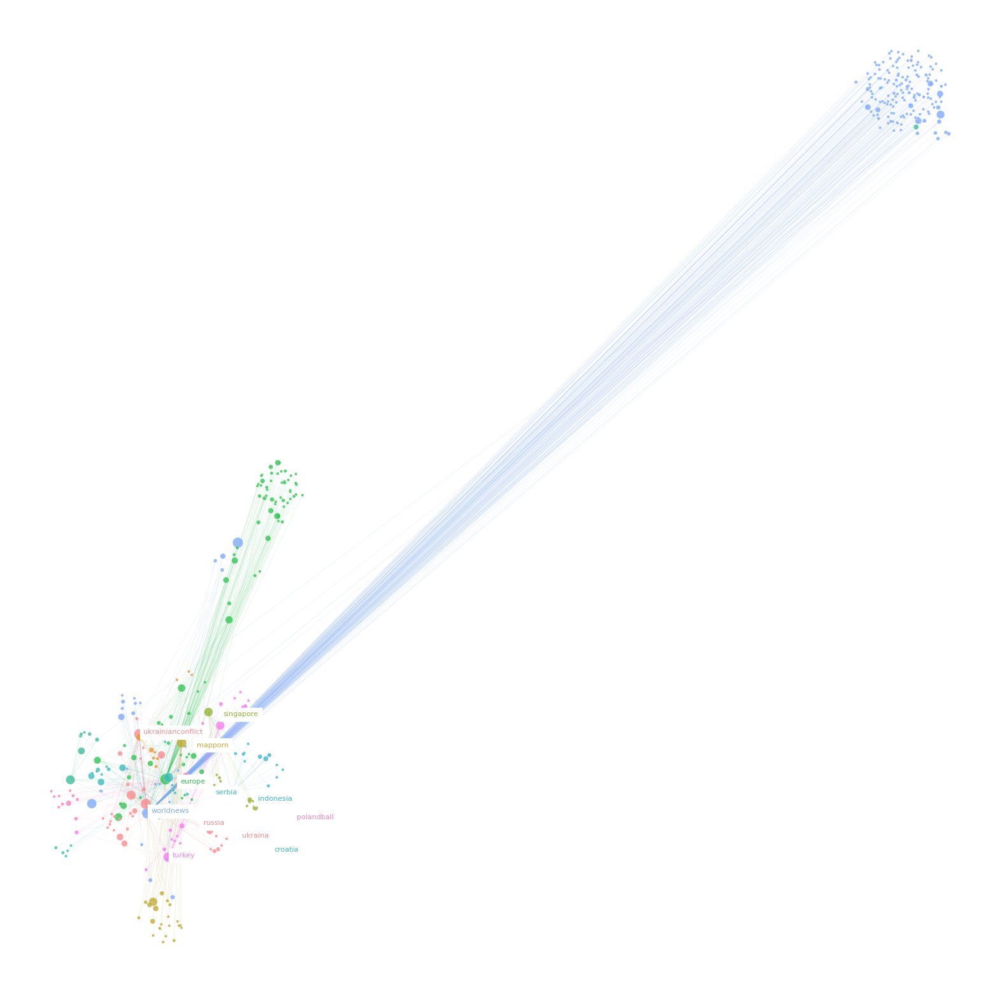

In [430]:
draw_graph(G_2014.subgraph(comms[9]), 20)

In [365]:
# COMPUTER SCIENCE
comms[10]

{'1p4',
 '2048editions',
 '2609',
 '4519',
 'accessibility',
 'ada',
 'adarkroom',
 'advancedcustomfields',
 'adventofcode',
 'agile',
 'aiclass',
 'algorithms',
 'altjs',
 'analytics',
 'anchorcms',
 'angular',
 'angular2',
 'angulardart',
 'angularjs',
 'annoyinonesentence',
 'answermarket',
 'apache',
 'appengine',
 'ascii',
 'askcompsci',
 'askcomputerscience',
 'askprogrammers',
 'askprogramming',
 'asksysadmin',
 'asmjs',
 'asshathackers',
 'assurityagile',
 'atom',
 'ats',
 'atwoodslaw',
 'autodidact',
 'bangawker',
 'barbarianprogramming',
 'bauski',
 'bestoflizardculture',
 'bioinformatics',
 'bitbucket',
 'bittorrent',
 'bluehost',
 'bohwaz',
 'bootstrap',
 'brainfuck',
 'businessanalysis',
 'butrspilicon0s0tatrn',
 'c_language',
 'c_programming',
 'cakephp',
 'careersushi',
 'carml',
 'cbase',
 'cem1790',
 'chapel',
 'cheatsheets',
 'chevres',
 'chi',
 'cicadalanguage',
 'clion',
 'clojure',
 'clojurescript',
 'cloudatcost',
 'cloudflare',
 'cmvprogramming',
 'code',
 'codec

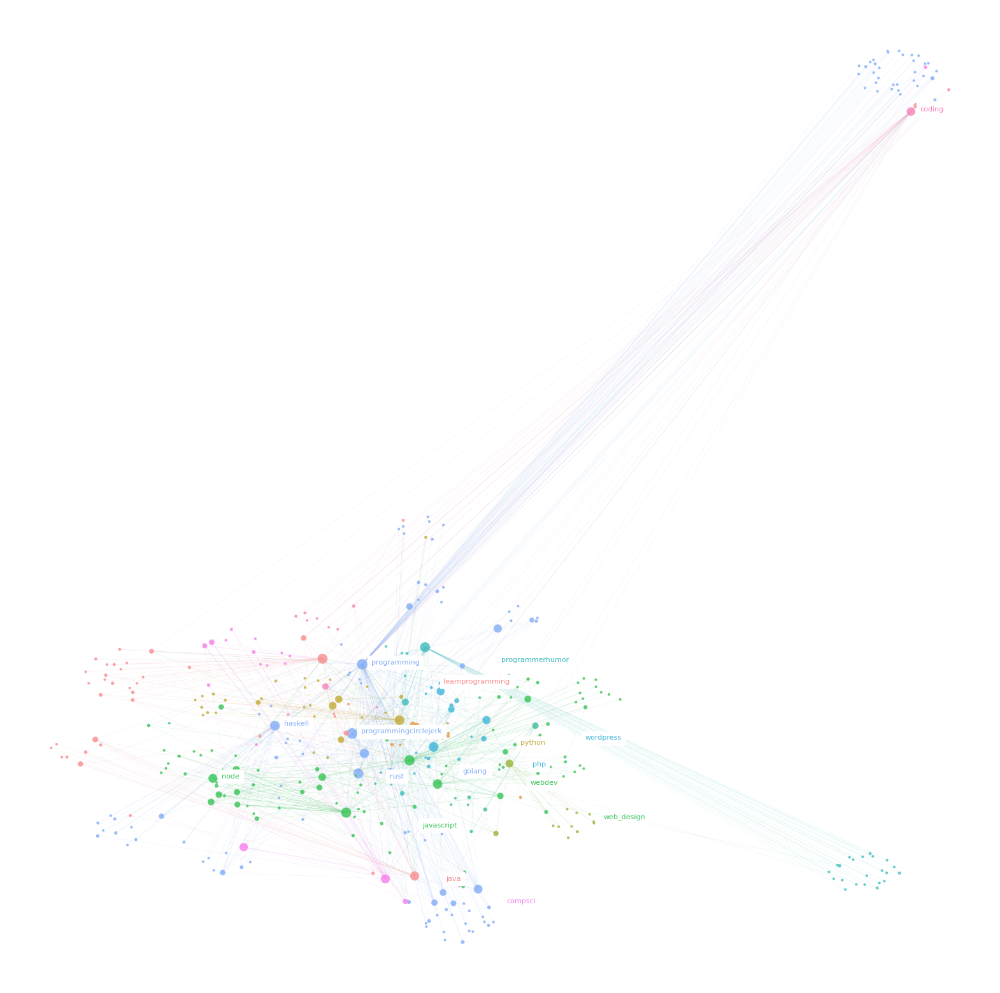

In [431]:
draw_graph(G_2014.subgraph(comms[10]), 20)

In [367]:
# TOXIC POLITICS
comms[11]

{'adolfhitler',
 'adoseofbuckley',
 'againsteverysubreddit',
 'againsthatesubreddits',
 'againstlovesubreddits',
 'againstmeansubreddits',
 'ahsbrigadewatch',
 'aidsskrillex',
 'alter_europa',
 'alternativefacts',
 'alternativeright',
 'altfacts',
 'altism',
 'altright',
 'altrightwatch',
 'anti_establishment',
 'anti_trump',
 'anystories',
 'askberniesupporters',
 'askthe_donald',
 'asktrumpsupporters',
 'assangeproofoflife',
 'awpgod1337',
 'ban_the_donald',
 'bangkokpostauto',
 'banislam',
 'bannedfromthe_donald',
 'banthe_donald',
 'basedhitlernews',
 'basket_of_deplorables',
 'battleofthesexes',
 'berlintruckattack',
 'bernie_sanders',
 'berniegutman',
 'bernitdown',
 'berntheconvention',
 'bestofmeta',
 'bestpresidenttrump',
 'bigly',
 'bikersfortrump',
 'billnyesucks',
 'bipartisandebate',
 'blackcrimematters',
 'blackoutnews',
 'blm_are_terrorists',
 'bombshell_on_target',
 'both_sides',
 'bptcirclejerk',
 'brainwashedamerica',
 'breastenvy',
 'brettkeanetrolling',
 'brightonva

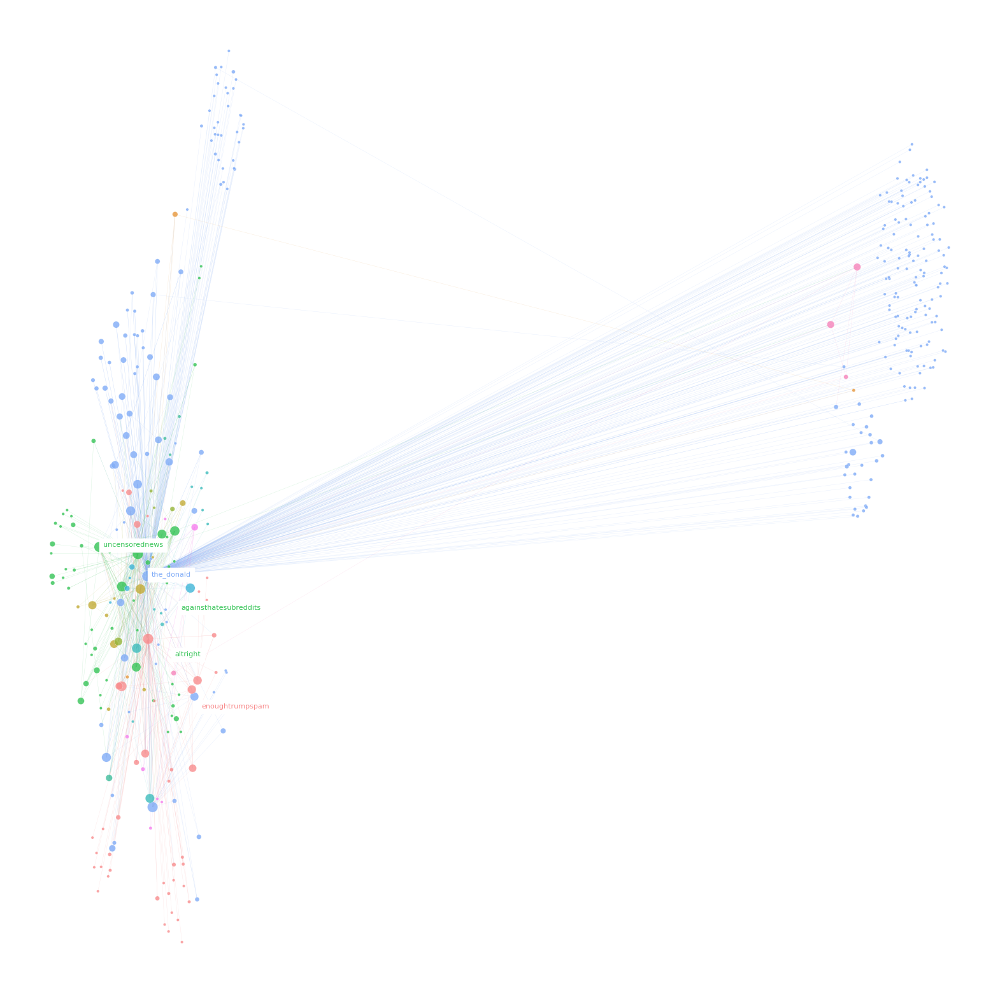

In [432]:
draw_graph(G_2014.subgraph(comms[11]), 20)

In [369]:
# CRYPTO
comms[12]

{'21dotco',
 'abstergoindustries',
 'acceptbitcoin',
 'acceptingbtc',
 'actuallygoodnews',
 'adviceanlmals',
 'aerocoin',
 'altcointip',
 'appinventor',
 'applepay',
 'argenbitcoin',
 'argenpool',
 'auscoin',
 'austinbtc',
 'austinmeshnet',
 'autruche',
 'badinvesting',
 'bazaarmarkets',
 'bcbc',
 'benjamins',
 'benlawsky',
 'best_of_crypto',
 'bestof2013',
 'bestofbitcoin',
 'betmoose',
 'betterbitcoin',
 'bfxvictims',
 'bilderberg',
 'bitask',
 'bitcache',
 'bitcloud',
 'bitcoin',
 'bitcoin4games',
 'bitcoin_ancap',
 'bitcoin_censorship',
 'bitcoin_core_dev',
 'bitcoin_elitism',
 'bitcoin_greece',
 'bitcoin_news',
 'bitcoin_qi',
 'bitcoin_singapore',
 'bitcoin_unmoderated',
 'bitcoinaus',
 'bitcoinaustin',
 'bitcoinaustralia',
 'bitcoinball',
 'bitcoinbe',
 'bitcoinbeer',
 'bitcoinbeg',
 'bitcoinbeginners',
 'bitcoinbitching',
 'bitcoinbums',
 'bitcoinbusiness',
 'bitcoinca',
 'bitcoinch',
 'bitcoincharity',
 'bitcoincirclejerk',
 'bitcoincolombia',
 'bitcoincuredmycancer',
 'bitcoin

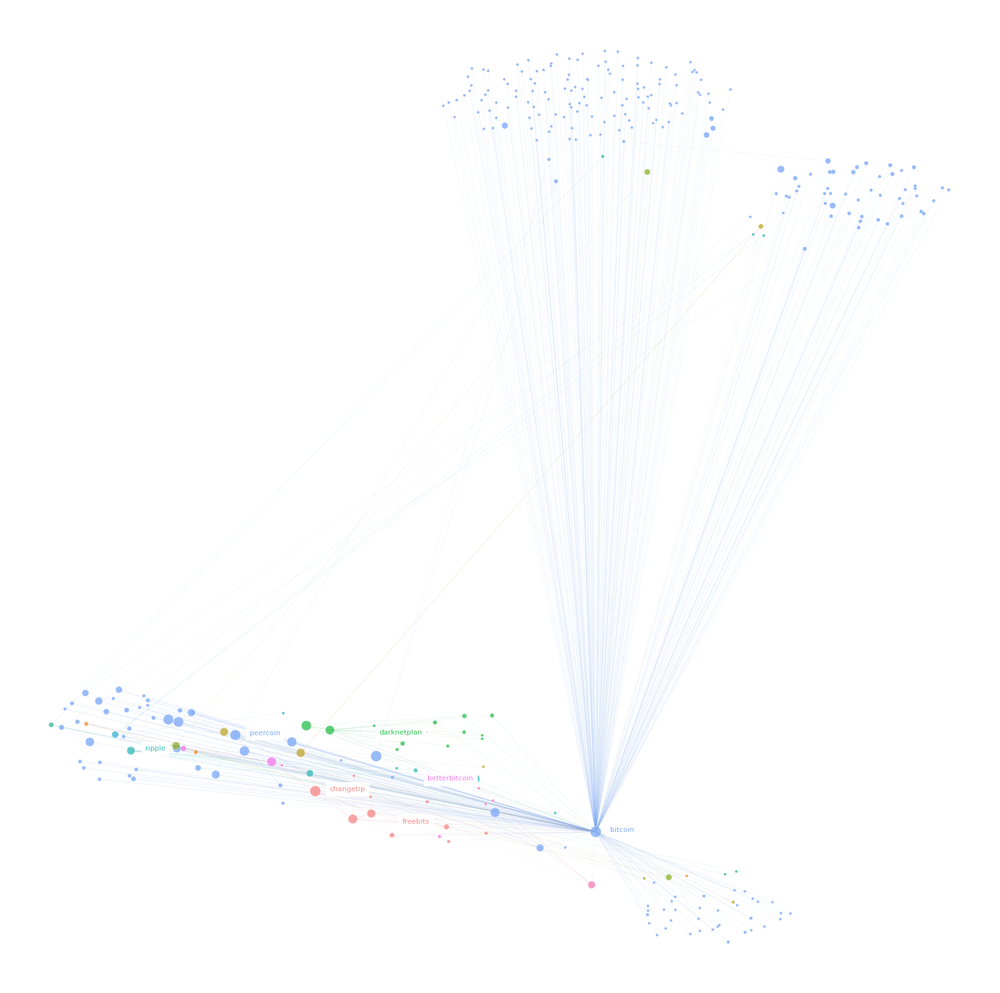

In [434]:
draw_graph(G_2014.subgraph(comms[12]), 10)

## While not all communities found seem to make sense on first glance, several in the top 15 were very clearly able to be grouped by topic - the Louvian community detection appears to be effective on this graph, at least somewhat.

# 5 - Negative Traffic

## Visual representation of negative traffic links

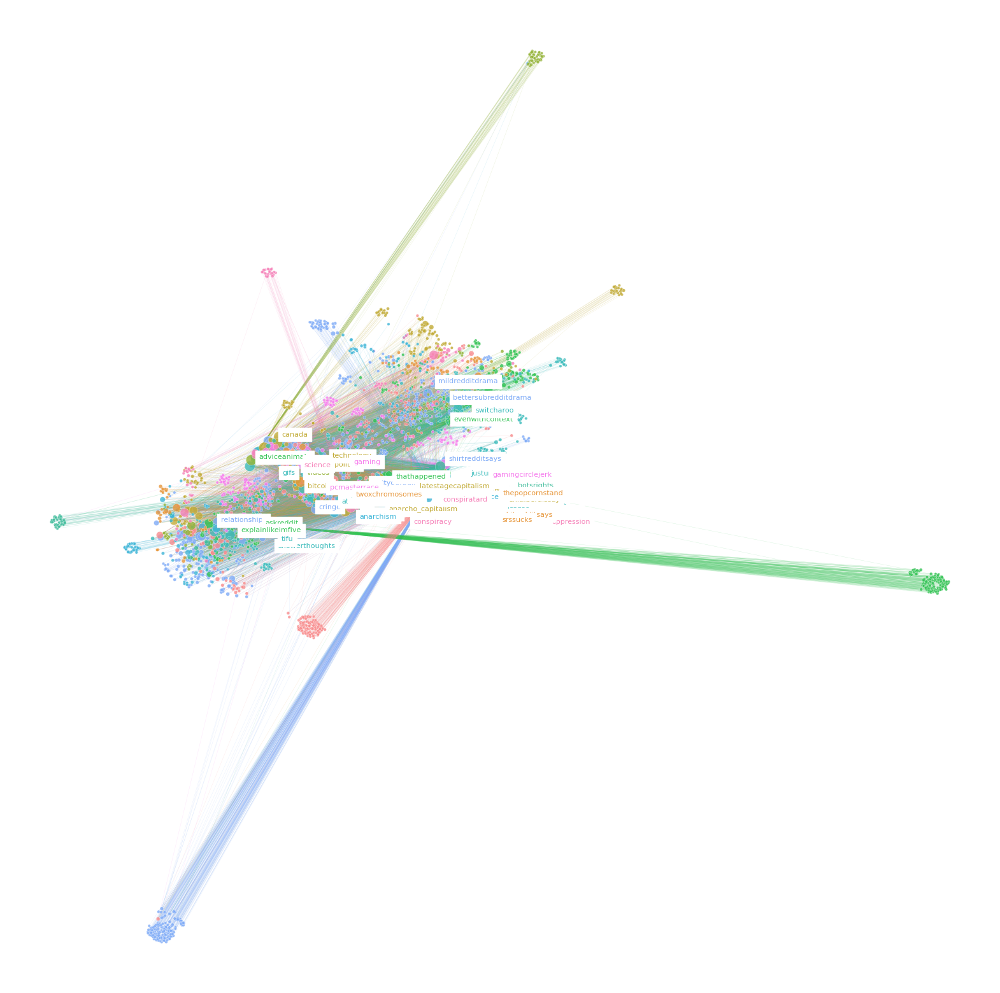

In [435]:
draw_graph(G_neg_2014, 100)

## Looking for the most 'toxic' communities

In [436]:
out_degree_centrality_negative = dict(nx.out_degree_centrality(G_neg_2014))
in_degree_centrality_negative = dict(nx.in_degree_centrality(G_neg_2014))
out_degree_centrality_all = dict(nx.out_degree_centrality(G_2014))
in_degree_centrality_all = dict(nx.in_degree_centrality(G_2014))

In [437]:
centrality_df = pd.DataFrame([out_degree_centrality_negative, in_degree_centrality_negative, out_degree_centrality_all, in_degree_centrality_all])

In [438]:
centrality_df = centrality_df.T
centrality_df = centrality_df.fillna(0)
centrality_df.columns = ['negative_outgoing','negative_incoming','all_outgoing','all_incoming']

In [439]:
centrality_df['outgoing_ratio'] = centrality_df['negative_outgoing']/centrality_df['all_outgoing']
centrality_df['incoming_ratio'] = centrality_df['negative_incoming']/centrality_df['all_incoming']
centrality_df = centrality_df[centrality_df['negative_outgoing'] > 0.001]
avg_all_ratio = centrality_df['incoming_ratio'].mean()
centrality_df['mean_incoming_ratio'] = avg_all_ratio
centrality_df['% difference from mean ratio'] = 100 *(centrality_df['incoming_ratio'] - avg_all_ratio)/avg_all_ratio

In [440]:
centrality_df = centrality_df.sort_values('outgoing_ratio',ascending=False)
centrality_df = centrality_df.dropna() 

## Most toxic communities by ratio of negative/all posts originating from that community

In [441]:
centrality_df.head(20)

,negative_outgoing,negative_incoming,all_outgoing,all_incoming,outgoing_ratio,incoming_ratio,mean_incoming_ratio,% difference from mean ratio
brockturnerinnocent,0.001204,0.000328,0.000222,0.000055,5.426145,5.919431,1.356286,336.444251
ebolahoax,0.001533,0.000000,0.000351,0.000092,4.361686,0.000000,1.356286,-100.000000
peoplefuckingdying,0.001204,0.000328,0.000277,0.000555,4.340916,0.591943,1.356286,-56.355575
shitsocialismsays,0.002518,0.000109,0.000610,0.000166,4.125664,0.657715,1.356286,-51.506194
publichealthwatch,0.013793,0.000985,0.003421,0.000388,4.031612,2.536899,1.356286,87.047536
bestofpoutrageculture,0.001861,0.000000,0.000481,0.000018,3.870397,0.000000,1.356286,-100.000000
bnestrong,0.002299,0.000657,0.000610,0.000481,3.766910,1.366022,1.356286,0.717904
straya,0.002627,0.000876,0.000721,0.000388,3.642727,2.255021,1.356286,66.264477
leftwithsharpedge,0.003503,0.000438,0.000980,0.000092,3.573996,4.735545,1.356286,249.155401
amrsucks,0.003503,0.000438,0.000980,0.000185,3.573996,2.367772,1.356286,74.577700


## Most toxic communities by quantity of negative posts from that community (out degree)

In [442]:
centrality_df = centrality_df.sort_values('negative_outgoing',ascending=False)
centrality_df.head(20)

,negative_outgoing,negative_incoming,all_outgoing,all_incoming,outgoing_ratio,incoming_ratio,mean_incoming_ratio,% difference from mean ratio
subredditdrama,0.170443,0.025616,0.049173,0.011799,3.466173,2.171076,1.356286,60.075164
bestof,0.119431,0.009524,0.057532,0.007286,2.075892,1.307082,1.356286,-3.627792
drama,0.074658,0.008539,0.021803,0.004087,3.424132,2.089211,1.356286,54.039147
botsrights,0.041817,0.000766,0.014517,0.000499,2.880538,1.534667,1.356286,13.152213
circlebroke2,0.037876,0.001861,0.012631,0.001036,2.998716,1.796970,1.356286,32.492005
shitpost,0.036891,0.001423,0.014462,0.000721,2.550957,1.973144,1.356286,45.481417
shitamericanssay,0.028790,0.003612,0.014184,0.001923,2.029740,1.878281,1.356286,38.487118
shitredditsays,0.028462,0.007225,0.016256,0.003514,1.750912,2.056223,1.356286,51.606950
evenwithcontext,0.026710,0.000000,0.008951,0.000018,2.984176,0.000000,1.356286,-100.000000
shitstatistssay,0.024849,0.001970,0.010541,0.000962,2.357387,2.049034,1.356286,51.076856


## Looking at proportion of negative traffic driven by top 10 negative communities

In [443]:
toxic_subs = list(centrality_df.head(10).index)
num_edges_in_toxic_set = 0
num_edges_in_normal_set = 0

for node in toxic_subs:
    num_edges_in_toxic_set += G_neg_2014.out_degree(node)
    num_edges_in_normal_set += G_2014.out_degree(node)

In [447]:
total_negative_links = len(G_neg_2014.edges)
total_all_links = len(G_2014.edges)
total_num_communities = len(G_2014.nodes)

In [451]:
print('% of negative posts made by top 10 negative subreddits: ' + str((100*num_edges_in_toxic_set/total_negative_links)))
print('Those communities make up ' + str((10/total_num_communities)) + ' % of all communities in the dataset (' + str(total_num_communities) +' in set)')
print('% of all posts made by those same 10 negative subreddits: ' + str((100*num_edges_in_normal_set/total_all_links)))


% of negative posts made by top 10 negative subreddits: 18.41952353282975
Those communities make up 0.0001849283402681461 % of all communities in the dataset (54075 in set)
% of all posts made by those same 10 negative subreddits: 5.067889876997513


## Looking at relationship between outgoing and incoming negative traffic

In [452]:
X = centrality_df['outgoing_ratio']
y = centrality_df['incoming_ratio']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33)
x_train= X_train.values.reshape(-1, 1)
x_test = X_test.values.reshape(-1, 1)

In [453]:
reg = LinearRegression().fit(x_train, y_train)

In [454]:
predicted = reg.predict(x_test)

In [455]:
# Weak r2 but still positive relationship
r2_score(y_test, predicted)

0.11762698432029772

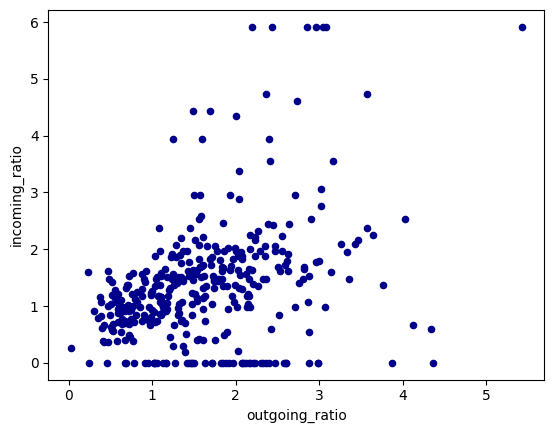

In [457]:
centrality_df.plot.scatter(x='outgoing_ratio',y='incoming_ratio',c='DarkBlue')
plt.show()

## There is a small positive correlation between outgoing and incoming negative traffic, suggesting that subreddit communities spreading hate are also receiving it.

# 6 - 2014 vs. 2023

## Need to take same nodeset in both datasets for worthwhile comparasion

In [469]:
nodeset = set()
nodeset_2014 = set(data_2014['SOURCE_SUBREDDIT'].unique()).union(set(data_2014['TARGET_SUBREDDIT']))
nodeset_2023 = set(data_2023['SOURCE_SUBREDDIT'].unique()).union(set(data_2023['TARGET_SUBREDDIT']))
nodeset = nodeset_2014.intersection(nodeset_2023)


In [471]:
adjusted_2014_data = data_2014[(data_2014['SOURCE_SUBREDDIT'].isin(nodeset))&(data_2014['TARGET_SUBREDDIT'].isin(nodeset))]

In [472]:
adjusted_2023_data = data_2023[(data_2023['SOURCE_SUBREDDIT'].isin(nodeset))&(data_2023['TARGET_SUBREDDIT'].isin(nodeset))]

In [473]:
new_G_2014 = make_di_graph(adjusted_2014_data)

In [474]:
new_G_2023 = make_di_graph(adjusted_2023_data)

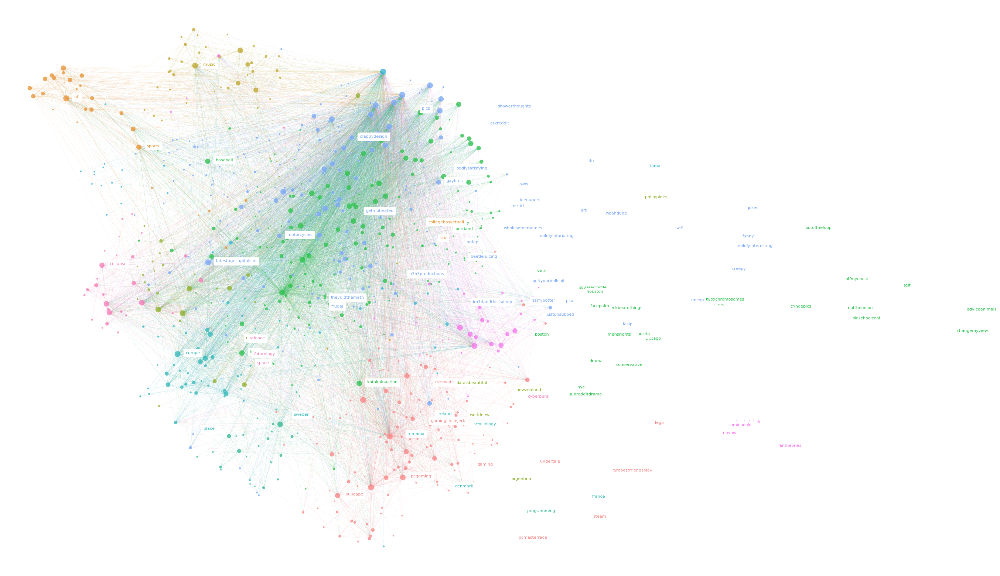

In [475]:
draw_graph(new_G_2014, 50)

/Users/claramoore/Desktop/VSCode_Projecrs/TestingStuff/venv/lib/python3.10/site-packages/graspologic/embed/base.py:199: UserWarning: Input graph is not fully connected. Results may notbe optimal. You can compute the largest connected component byusing ``graspologic.utils.largest_connected_component``.
  warnings.warn(msg, UserWarning)


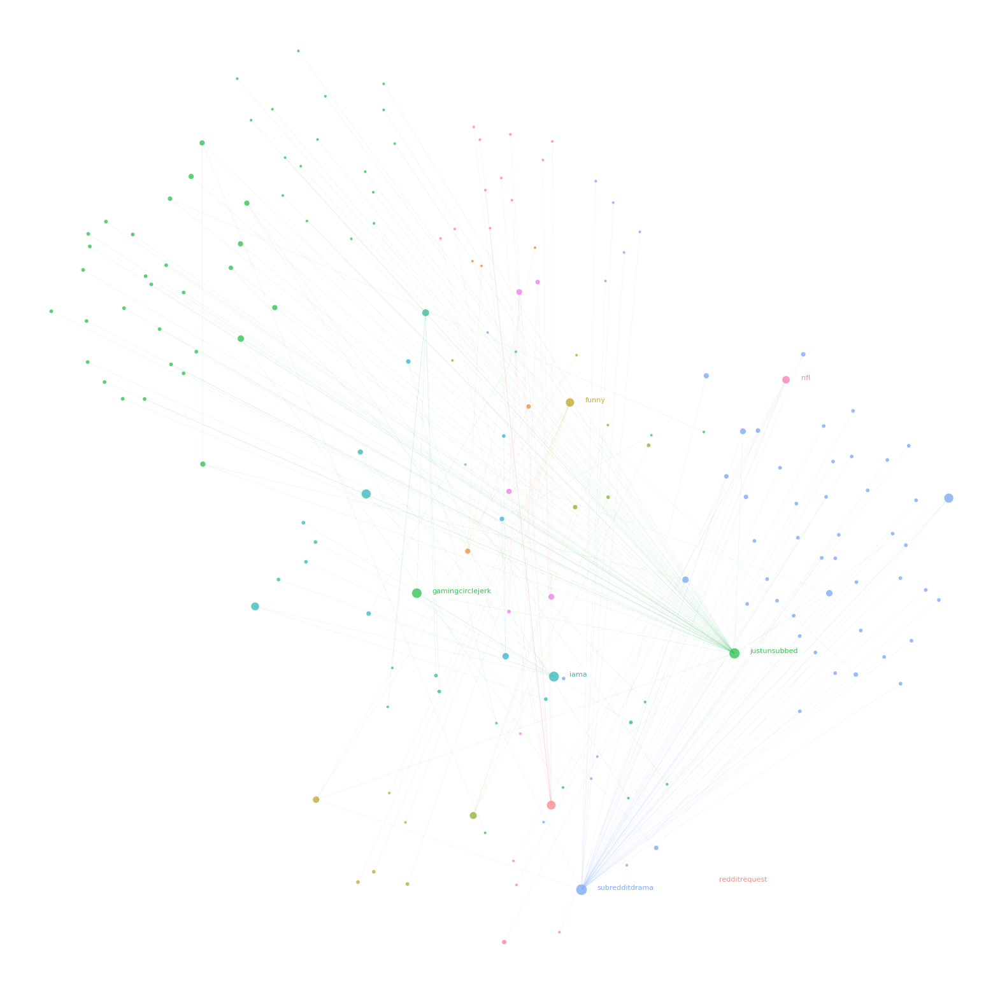

In [479]:
draw_graph(new_G_2023, 5)

In [480]:
nx.is_weakly_connected(new_G_2014)

False

In [481]:
nx.is_weakly_connected(new_G_2023)

False

In [482]:
largest_cc_2014 = max(nx.weakly_connected_components(new_G_2014), key=len)
largest_cc_2014 = new_G_2014.subgraph(largest_cc)

In [483]:
largest_cc_2023 = max(nx.weakly_connected_components(new_G_2023), key=len)
largest_cc_2023 = new_G_2023.subgraph(largest_cc)

In [499]:
centrality_2014 = dict(nx.degree(new_G_2014))

In [500]:
sorted_centrality_2014 = {k: v for k, v in sorted(centrality_2014.items(), key=lambda item: item[1], reverse=True)}

In [501]:
centrality_2023 = dict(nx.degree(new_G_2023))

In [502]:
sorted_centrality_2023 = {k: v for k, v in sorted(centrality_2023.items(), key=lambda item: item[1], reverse=True)}

In [503]:
sorted_centrality_2014

{'subredditdrama': 689,
 'funny': 533,
 'iama': 526,
 'askreddit': 479,
 'pics': 470,
 'gaming': 415,
 'drama': 353,
 'wtf': 287,
 'theydidthemath': 266,
 'pcmasterrace': 255,
 'worldnews': 253,
 'conspiracy': 242,
 'movies': 236,
 'mildlyinteresting': 219,
 'science': 213,
 'technology': 208,
 'dataisbeautiful': 183,
 'trees': 180,
 'politics': 179,
 'adviceanimals': 166,
 'latestagecapitalism': 161,
 'showerthoughts': 158,
 'india': 151,
 'leagueoflegends': 150,
 'music': 149,
 'shitliberalssay': 148,
 'aww': 143,
 'gamingcirclejerk': 139,
 'diy': 137,
 'dota2': 136,
 'books': 132,
 'cringe': 130,
 'tifu': 129,
 'mensrights': 125,
 'europe': 124,
 'nottheonion': 123,
 'twoxchromosomes': 123,
 'programming': 120,
 'dogecoin': 119,
 'television': 118,
 'globaloffensive': 118,
 'beetlejuicing': 117,
 'soccer': 117,
 'sports': 116,
 'nba': 113,
 'nfl': 111,
 'justneckbeardthings': 111,
 'quityourbullshit': 110,
 'food': 109,
 'squaredcircle': 109,
 'unexpected': 108,
 'creepy': 107,
 'dr

In [504]:
sorted_centrality_2023

{'justunsubbed': 62,
 'subredditdrama': 61,
 'redditrequest': 11,
 'iama': 9,
 'gaming': 7,
 'gamingcirclejerk': 6,
 'nfl': 6,
 'funny': 6,
 'art': 5,
 'memes': 5,
 'radarr': 4,
 'starterpacks': 4,
 'drugscirclejerk': 4,
 'funnyandsad': 4,
 'gamephysics': 4,
 'beetlejuicing': 4,
 'mildlyinfuriating': 4,
 'football': 4,
 'selfawarewolves': 3,
 'meirl': 3,
 'conspiracy': 3,
 'mildlyinteresting': 3,
 'trans': 3,
 'espresso': 3,
 'transgendercirclejerk': 3,
 'cringepics': 3,
 'askreddit': 3,
 'kodi': 3,
 'europe': 3,
 'oddlyterrifying': 3,
 'damnthatsinteresting': 3,
 'doesanybodyelse': 3,
 'murderedbywords': 3,
 'developer': 3,
 'humansbeingbros': 3,
 'announcements': 3,
 'guitarcirclejerk': 3,
 'actress': 3,
 'satisfyingasfuck': 3,
 'restaurant': 3,
 'pics': 3,
 'kotakuinaction': 3,
 'sonyalpha': 3,
 'mademesmile': 3,
 'electronicmusic': 3,
 'school': 3,
 'producer': 3,
 'animesuggest': 3,
 'hockey': 3,
 'politics': 3,
 'copypasta': 3,
 'baseball': 3,
 'soccercirclejerk': 3,
 'hardcore':

## Unfortunately, I was not able to get enough data to do a full analysis on the change in communities over time. However, we can see from simply looking at degree centrality, the same subreddits appear to be at the top (subredditdrama, iama, funny, gaming). It would be interesting to gather more data to do a more thorough comparasion.